# Predictive Analytics - Predicting Rainfall
### Importing Needed Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
import pickle
from matplotlib import pyplot
import matplotlib.pyplot as plt
%matplotlib inline
sns.set() 
import plotly.express as px


# Ignore harmless warnings
import warnings
warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:.2f}'.format

### Import the Data

In [2]:
df_rain = pd.read_csv('weatherAUS.csv')

In [3]:
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:
print(df_rain.shape)

(145460, 23)


In [5]:
df_rain.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,143975.00,12.19,6.40,-8.50,7.60,12.00,16.90,33.90
MaxTemp,144199.00,23.22,7.12,-4.80,17.90,22.60,28.20,48.10
Rainfall,142199.00,2.36,8.48,0.00,0.00,0.00,0.80,371.00
Evaporation,82670.00,5.47,4.19,0.00,2.60,4.80,7.40,145.00
Sunshine,75625.00,7.61,3.79,0.00,4.80,8.40,10.60,14.50
WindGustSpeed,135197.00,40.04,13.61,6.00,31.00,39.00,48.00,135.00
WindSpeed9am,143693.00,14.04,8.92,0.00,7.00,13.00,19.00,130.00
WindSpeed3pm,142398.00,18.66,8.81,0.00,13.00,19.00,24.00,87.00
Humidity9am,142806.00,68.88,19.03,0.00,57.00,70.00,83.00,100.00
Humidity3pm,140953.00,51.54,20.80,0.00,37.00,52.00,66.00,100.00


In [6]:
df_rain.describe(include=[object]).T

,count,unique,top,freq
Date,145460,3436,2015-01-29,49
Location,145460,49,Canberra,3436
WindGustDir,135134,16,W,9915
WindDir9am,134894,16,N,11758
WindDir3pm,141232,16,SE,10838
RainToday,142199,2,No,110319
RainTomorrow,142193,2,No,110316


## Data Preprocessing

In [7]:
df_rain.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [8]:
cat_columns = [column_name for column_name in df_rain.columns if df_rain[column_name].dtype == 'O']
print('Number of Categorical Features: {}'.format(len(cat_columns)))
print('Categorical Features: ',cat_columns)

Number of Categorical Features: 7
Categorical Features:  ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [9]:
num_columns = [column_name for column_name in df_rain.columns if df_rain[column_name].dtype != 'O']
print('Number of Numerical Features: {}'.format(len(num_columns)))
print('Numerical Features: ',num_columns)

Number of Numerical Features: 16
Numerical Features:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


After taking an initial look at the data, we can see that there are null values in every column except the date and location columns. Above we see the different categorical and the numerical columns. 

There are two different types of data in the dataset: object and float.

We will need to handle the missing values before we can do any kind of predictive analytics. 

Our target variable is going to be RainTomorrow, so first I will deal with rows missing this value by removing them. Then I will deal with the RainToday null values.

In [10]:
df_rain.drop(df_rain[df_rain.RainTomorrow.isnull()].index, inplace=True)
df_rain.drop(df_rain[df_rain.RainToday.isnull()].index, inplace=True)

In [11]:
df_rain.isnull().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

Great, that took care of the two rain columns. 

Now that we've taken care of the rain today and tomorrow columns, we need to focus on the other columns that have null values. I think that we need to fill in the null values with the most common value for each column based on location. 

In [12]:
numerical = list(df_rain.select_dtypes(include = np.number).columns)

In [13]:
for x in numerical:
    r = df_rain.groupby(['Location'])[x].median().fillna(0).reset_index()
    for i in r.Location.unique():
        df_rain.loc[(df_rain.Location == i),[x]] = df_rain.loc[(df_rain.Location == i),[x]].fillna(r.loc[r.Location == i, x].item())

In [14]:
df_rain.isnull().sum()

Date                0
Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      9163
WindGustSpeed       0
WindDir9am       9660
WindDir3pm       3670
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
dtype: int64

In [15]:
windgust = pd.crosstab(index = df_rain['Location'], columns = df_rain['WindGustDir']).unstack().reset_index().rename(columns = {0: 'Freq'})
for i in windgust.Location.unique():
        df_rain.loc[(df_rain.WindGustDir.isnull()) & (df_rain.Location == i),'WindGustDir'] = df_rain.loc[df_rain.Location == i,'WindGustDir'].value_counts().idxmax()
df_rain.loc[df_rain['WindGustDir'].isnull(),'WindGustDir'] = df_rain['WindGustDir'].value_counts().idxmax()
wind9am = pd.crosstab(index = df_rain['Location'], columns = df_rain['WindDir9am']).unstack().reset_index().rename(columns = {0: 'Freq'})
for i in wind9am.Location.unique():
        df_rain.loc[(df_rain.WindDir9am.isnull()) & (df_rain.Location == i),'WindDir9am'] = df_rain.loc[df_rain.Location == i,'WindDir9am'].value_counts().idxmax()
df_rain.loc[df_rain['WindDir9am'].isnull(),'WindDir9am'] = df_rain['WindDir9am'].value_counts().idxmax()

wind3pm = pd.crosstab(index = df_rain['Location'], columns = df_rain['WindDir3pm']).unstack().reset_index().rename(columns = {0: 'Freq'})
for i in wind9am.Location.unique():
        df_rain.loc[(df_rain.WindDir3pm.isnull()) & (df_rain.Location == i),'WindDir3pm'] = df_rain.loc[df_rain.Location == i,'WindDir3pm'].value_counts().idxmax()
df_rain.loc[df_rain['WindDir3pm'].isnull(),'WindDir3pm'] = df_rain['WindDir3pm'].value_counts().idxmax()

In [16]:
df_rain.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [17]:
print('Unique Values in Date:', df_rain['Date'].nunique())
print('Unique Values in Location:', df_rain['Location'].nunique())
print('Unique Values in WindGustDir:', df_rain['WindGustDir'].nunique())
print('Unique Values in WindDir9am:', df_rain['WindDir9am'].nunique())
print('Unique Values in WindDir3pm:', df_rain['WindDir3pm'].nunique())
print('Unique Values in RainToday:', df_rain['RainToday'].nunique())
print('Unique Values in RainTomorrow:', df_rain['RainTomorrow'].nunique())

Unique Values in Date: 3436
Unique Values in Location: 49
Unique Values in WindGustDir: 16
Unique Values in WindDir9am: 16
Unique Values in WindDir3pm: 16
Unique Values in RainToday: 2
Unique Values in RainTomorrow: 2


The Date column has many unique values and this might interfere with our modeling so I will feature engineer this column.

In [18]:
df_rain['Date'] = pd.to_datetime(df_rain['Date'])
df_rain['Year'] = df_rain['Date'].dt.year.astype('float64')
df_rain['Month'] = df_rain['Date'].dt.month.astype('float64')

df_rain.drop('Date', axis = 1, inplace = True)
df_rain

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,Albury,13.40,22.90,0.60,0.00,0.00,W,44.00,W,WNW,...,1007.70,1007.10,8.00,7.00,16.90,21.80,No,No,2008.00,12.00
1,Albury,7.40,25.10,0.00,0.00,0.00,WNW,44.00,NNW,WSW,...,1010.60,1007.80,8.00,7.00,17.20,24.30,No,No,2008.00,12.00
2,Albury,12.90,25.70,0.00,0.00,0.00,WSW,46.00,W,WSW,...,1007.60,1008.70,8.00,2.00,21.00,23.20,No,No,2008.00,12.00
3,Albury,9.20,28.00,0.00,0.00,0.00,NE,24.00,SE,E,...,1017.60,1012.80,8.00,7.00,18.10,26.50,No,No,2008.00,12.00
4,Albury,17.50,32.30,1.00,0.00,0.00,W,41.00,ENE,NW,...,1010.80,1006.00,7.00,8.00,17.80,29.70,No,No,2008.00,12.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,Uluru,3.50,21.80,0.00,0.00,0.00,E,31.00,ESE,E,...,1024.70,1021.20,7.00,5.00,9.40,20.90,No,No,2017.00,6.00
145455,Uluru,2.80,23.40,0.00,0.00,0.00,E,31.00,SE,ENE,...,1024.60,1020.30,7.00,5.00,10.10,22.40,No,No,2017.00,6.00
145456,Uluru,3.60,25.30,0.00,0.00,0.00,NNW,22.00,SE,N,...,1023.50,1019.10,7.00,5.00,10.90,24.50,No,No,2017.00,6.00
145457,Uluru,5.40,26.90,0.00,0.00,0.00,N,37.00,SE,WNW,...,1021.00,1016.80,7.00,5.00,12.50,26.10,No,No,2017.00,6.00


### Outlier Detection and Processing

<AxesSubplot:xlabel='RainTomorrow', ylabel='Temp3pm'>

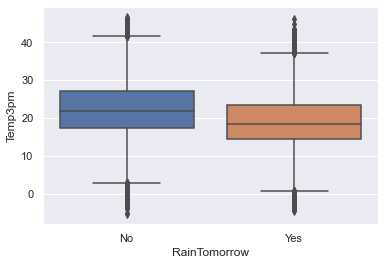

In [19]:
sns.boxplot(data = df_rain, x = 'RainTomorrow', y = 'Temp3pm')

<AxesSubplot:xlabel='RainTomorrow', ylabel='WindGustSpeed'>

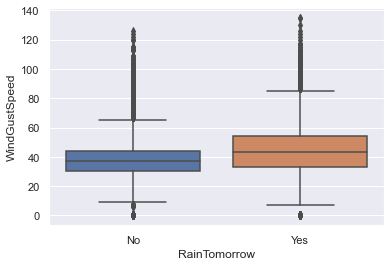

In [20]:
sns.boxplot(data = df_rain, x = 'RainTomorrow', y = 'WindGustSpeed')

<AxesSubplot:xlabel='RainTomorrow', ylabel='Sunshine'>

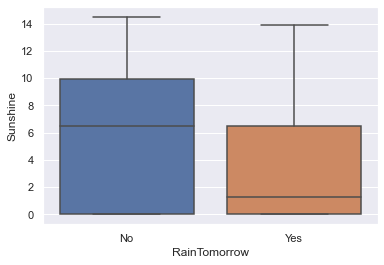

In [21]:
sns.boxplot(data = df_rain, x = 'RainTomorrow', y = 'Sunshine')

<AxesSubplot:xlabel='RainTomorrow', ylabel='Cloud3pm'>

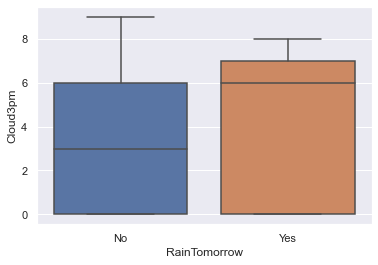

In [22]:
sns.boxplot(data = df_rain, x='RainTomorrow', y = 'Cloud3pm')

<AxesSubplot:xlabel='RainTomorrow', ylabel='Evaporation'>

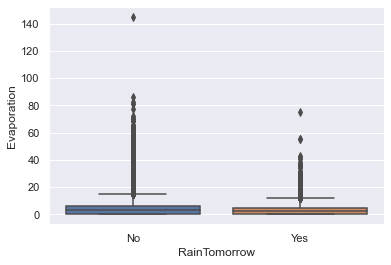

In [23]:
sns.boxplot(data = df_rain, x='RainTomorrow', y = 'Evaporation')

<AxesSubplot:xlabel='RainTomorrow', ylabel='Humidity3pm'>

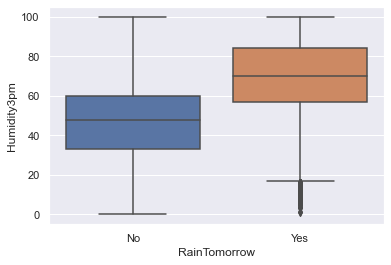

In [24]:
sns.boxplot(data = df_rain, x='RainTomorrow', y = 'Humidity3pm')

<AxesSubplot:xlabel='RainTomorrow', ylabel='Pressure3pm'>

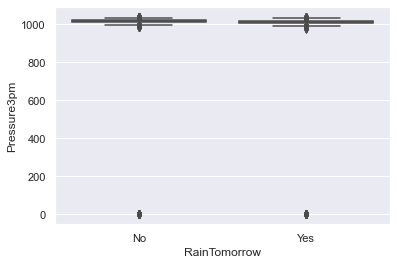

In [25]:
sns.boxplot(data = df_rain, x='RainTomorrow', y = 'Pressure3pm')

In [26]:
outliers = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustSpeed',
            'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
for a in outliers:
    Q1 = df_rain[a].quantile(0.25)
    Q3 = df_rain[a].quantile(0.75)
    IQR = Q3-Q1
    print('Q1: ', Q1)
    print('Q3:', Q3)
    print('IRQ:', IQR)
    Lower_Whisker = Q1-1.5*IQR
    Upper_Whisker = Q3+1.5*IQR
    print('Lower Whisker:', Lower_Whisker, ',', 'Upper Whisker:', Upper_Whisker)
    df_rain.loc[df_rain[a] < Lower_Whisker, a] = Lower_Whisker
    df_rain.loc[df_rain[a] > Upper_Whisker, a] = Upper_Whisker

Q1:  7.6
Q3: 16.8
IRQ: 9.200000000000001
Lower Whisker: -6.200000000000001 , Upper Whisker: 30.6
Q1:  17.9
Q3: 28.2
IRQ: 10.3
Lower Whisker: 2.4499999999999975 , Upper Whisker: 43.65
Q1:  0.0
Q3: 0.8
IRQ: 0.8
Lower Whisker: -1.2000000000000002 , Upper Whisker: 2.0
Q1:  0.0
Q3: 5.6
IRQ: 5.6
Lower Whisker: -8.399999999999999 , Upper Whisker: 13.999999999999998
Q1:  30.0
Q3: 46.0
IRQ: 16.0
Lower Whisker: 6.0 , Upper Whisker: 70.0
Q1:  7.0
Q3: 19.0
IRQ: 12.0
Lower Whisker: -11.0 , Upper Whisker: 37.0
Q1:  13.0
Q3: 24.0
IRQ: 11.0
Lower Whisker: -3.5 , Upper Whisker: 40.5
Q1:  57.0
Q3: 83.0
IRQ: 26.0
Lower Whisker: 18.0 , Upper Whisker: 122.0
Q1:  1011.5
Q3: 1021.8
IRQ: 10.299999999999955
Lower Whisker: 996.0500000000001 , Upper Whisker: 1037.25
Q1:  1009.0
Q3: 1019.4
IRQ: 10.399999999999977
Lower Whisker: 993.4000000000001 , Upper Whisker: 1035.0
Q1:  12.2
Q3: 21.5
IRQ: 9.3
Lower Whisker: -1.7500000000000018 , Upper Whisker: 35.45
Q1:  16.7
Q3: 26.4
IRQ: 9.7
Lower Whisker: 2.150000000000000

<AxesSubplot:xlabel='RainTomorrow', ylabel='Pressure3pm'>

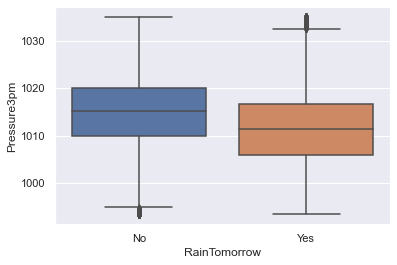

In [27]:
#checking that we removed the outliers
sns.boxplot(data = df_rain, x='RainTomorrow', y = 'Pressure3pm')

Data preprocessing is completed, I'll now move on to some EDA.

## EDA

The first thing we should look at is the target variable, RainTomorrow.

<AxesSubplot:>

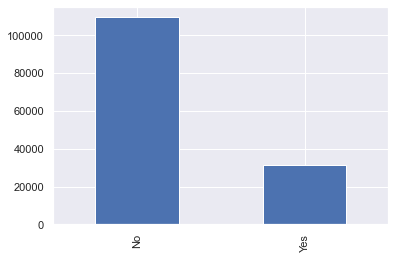

In [28]:
df_rain['RainTomorrow'].value_counts().plot(kind='bar')

There are substantially more no's than yes's in the dataset. This could effect the performance of my model later on.

In [29]:
df_rain.RainTomorrow = df_rain.RainTomorrow.map({'No':0, 'Yes':1}).astype('float64')

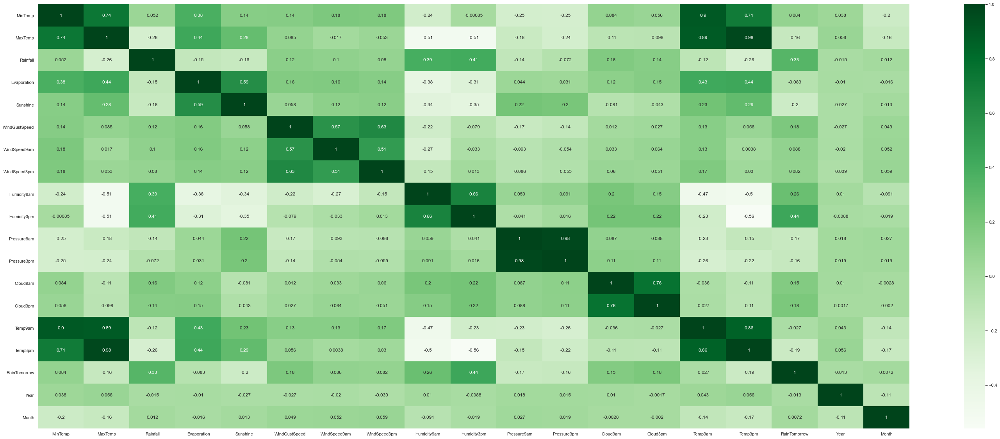

In [30]:
corr = df_rain.corr()
corr.style.background_gradient()

plt.figure(figsize=(50,20))
sns.heatmap(corr,annot=True,cmap='Greens')
plt.savefig('corr.png')

There are some variables that look to have a high correlation with our target variable (RainTomorrow). 

##### Negative Correlations:
- MaxTemp
- Sunshine
- Pressure
- Temp

##### Positive Correlations: 
- Rainfall
- Humidity
- Cloud

After taking a look at the correlation matrix, let's look at distribution for some of the important variables. 

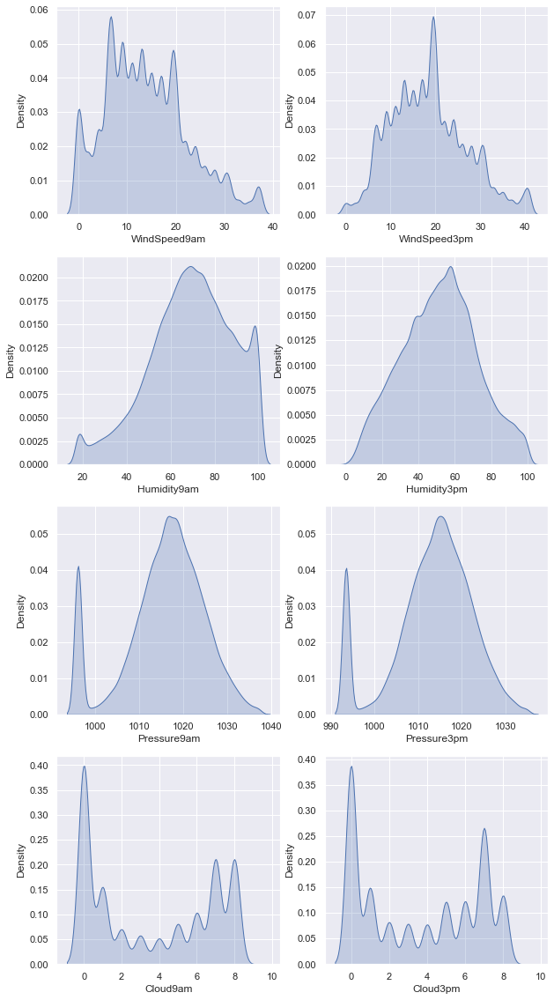

In [31]:
fig, ax = plt.subplots(4, 2, figsize = (10, 20))
sns.kdeplot(x = df_rain.WindSpeed9am, ax = ax [0, 0], shade = True)
sns.kdeplot(x = df_rain.WindSpeed3pm, ax = ax[0, 1], shade = True)
sns.kdeplot(x = df_rain.Humidity9am, ax = ax[1, 0], shade = True)
sns.kdeplot(x = df_rain.Humidity3pm, ax = ax[1, 1], shade = True)
sns.kdeplot(x = df_rain.Pressure9am, ax = ax[2, 0], shade=True)
sns.kdeplot(x = df_rain.Pressure3pm, ax = ax[2, 1], shade=True)
sns.kdeplot(x = df_rain.Cloud9am, ax = ax[3, 0], shade=True)
sns.kdeplot(x = df_rain.Cloud3pm, ax = ax[3, 1], shade=True);

plt.savefig('dist.png', bbox_inches='tight')

The distribution is similar between the 9am and 3pm variables for each category (i.e. wind at 9 and 3, pressure at 9 and 3, etc). There's not much variation that can be seen based on the time of day that the variable's value was measured. 

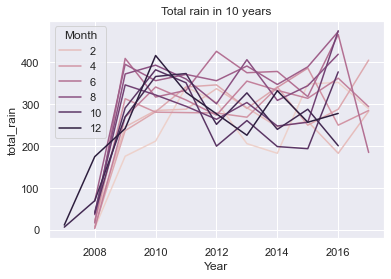

In [32]:
df_rain['RainToday'] = np.where(df_rain['RainToday'] == 'No', 0, 1)
df_rain['total_rain'] = df_rain['RainToday']
#Total rain month and year
total_rain_year = df_rain.groupby(['Year', 'Month'])['total_rain'].sum().reset_index()
fig,ax = plt.subplots()
sns.lineplot(data = total_rain_year, x = 'Year', y = 'total_rain', hue = 'Month').set(title = 'Total rain in 10 years');

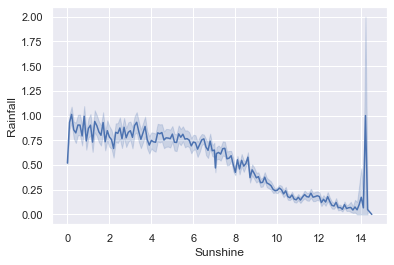

In [33]:
sns.lineplot(data = df_rain, x = 'Sunshine', y = 'Rainfall');

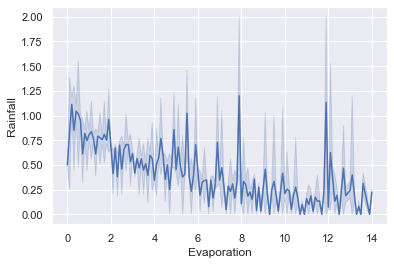

In [34]:
sns.lineplot(data = df_rain, x = 'Evaporation', y = 'Rainfall');

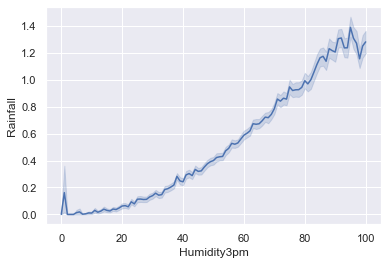

In [35]:
sns.lineplot(data = df_rain, x = 'Humidity3pm', y = 'Rainfall');

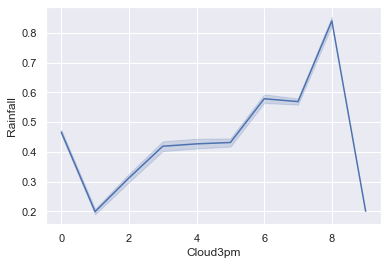

In [36]:
sns.lineplot(data = df_rain, x = 'Cloud3pm', y = 'Rainfall');

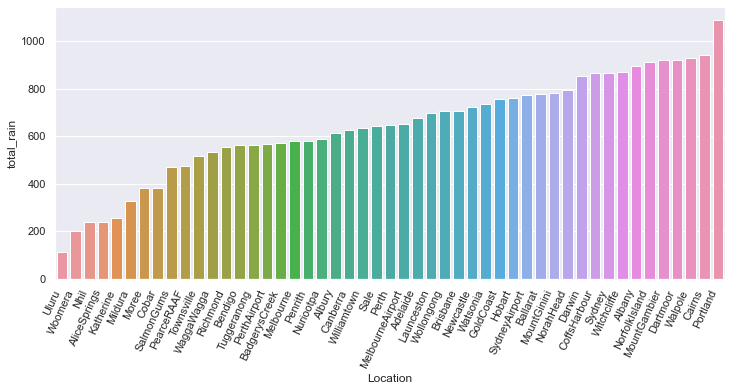

In [37]:
rain_location = df_rain.groupby(['Location'])['total_rain'].sum().reset_index()
plt.figure(figsize = (12, 5))
chart = sns.barplot(data = rain_location, y = 'total_rain', x = 'Location', order = rain_location.sort_values('total_rain').Location)
chart.set_xticklabels(chart.get_xticklabels(), rotation = 65, horizontalalignment = 'right', fontweight = 'light');
plt.savefig('location_rain.png', bbox_inches='tight')

Looking at the above, it looks like the most rain has come from Portland and the least amount has come from Uluru. Let's take a look at the temp by location now.

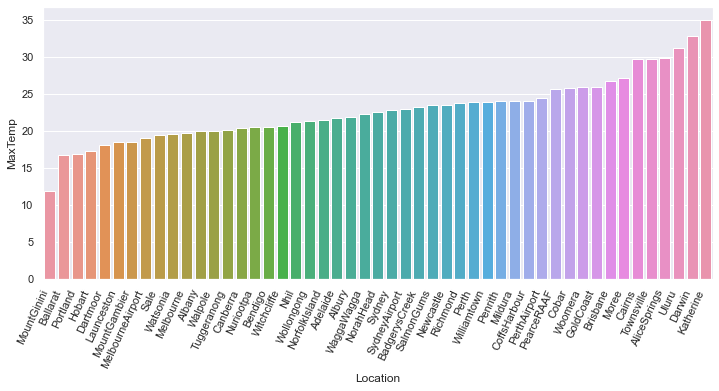

In [38]:
loc_temp = df_rain.groupby(['Location'])['MaxTemp'].median().reset_index()
plt.figure(figsize = (12, 5))
loc = sns.barplot(data = loc_temp, y = 'MaxTemp', x = 'Location', order = loc_temp.sort_values('MaxTemp').Location)
loc.set_xticklabels(loc.get_xticklabels(), rotation = 65, horizontalalignment = 'right');
plt.savefig('location_temp.png', bbox_inches='tight')

In comparison to the total rainfall by location, the hottest location looks to be Katherine and the coolest location is Mount Ginini. It makes sense that Uluru and Katherine are in the top locations for hottest locations because they are the bottom two locations for total rainfall. Darwin is in the warmest but also in the top 4 for most rainfall, I wonder if humidity has anything to do with this. 
Let's get the total rainfall for each month. 

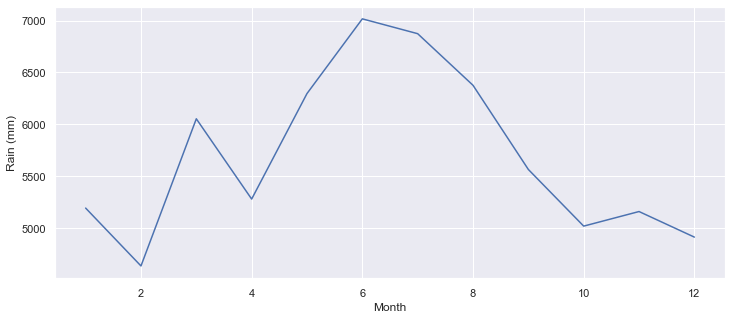

In [39]:
fig, (plot1) = plt.subplots(1, figsize = (12, 5))
monthly = df_rain.groupby(['Month'])['Rainfall'].sum().reset_index()
plot1.plot(monthly.Month, monthly.Rainfall)
plot1.set_xlabel('Month')
plot1.set_ylabel('Rain (mm)');
plt.savefig('rain_by_month.png', bbox_inches='tight')

The most rainfall occurs in June and the least amount occurs in Feb. Overall the most rain happens in the middle of the year and drops off towards the end and the beginning of the year.

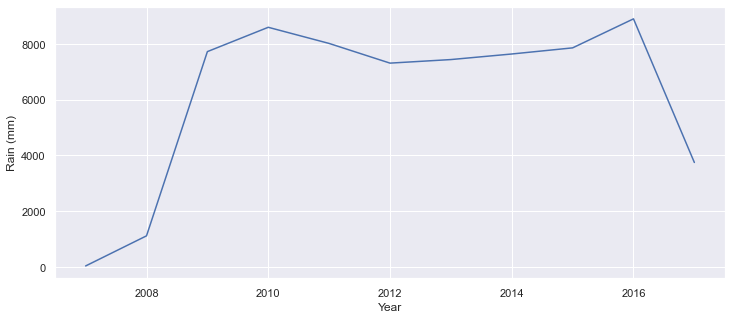

In [40]:
fig, (plot2) = plt.subplots(1, figsize = (12, 5))
yearly = df_rain.groupby(['Year'])['Rainfall'].sum().reset_index()
plot2.plot(yearly.Year, yearly.Rainfall)
plot2.set_xlabel('Year')
plot2.set_ylabel('Rain (mm)');
plt.savefig('rain_by_year.png', bbox_inches='tight')

The yearly rainfall increases dramatically in 2009 from 2008 and then drops off again in 2017.

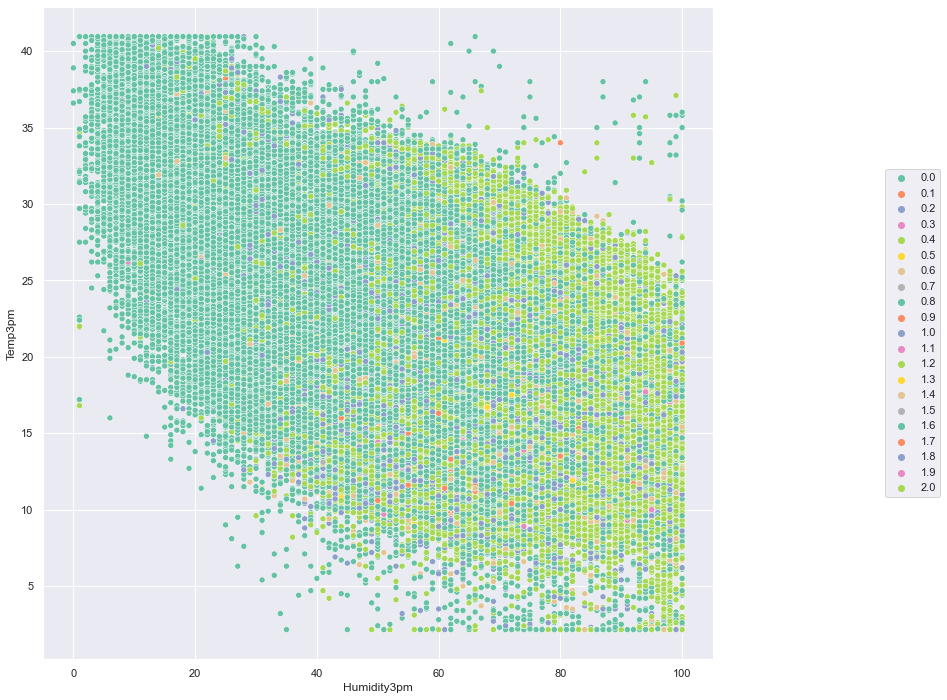

In [41]:
sns.set(rc = {'figure.figsize':(12,12)})
pop = sns.scatterplot(data = df_rain,x = 'Humidity3pm', y = 'Temp3pm', hue = 'Rainfall', palette = 'Set2')

pop.legend(loc = 'center left', bbox_to_anchor = (1.25, 0.5), ncol = 1)

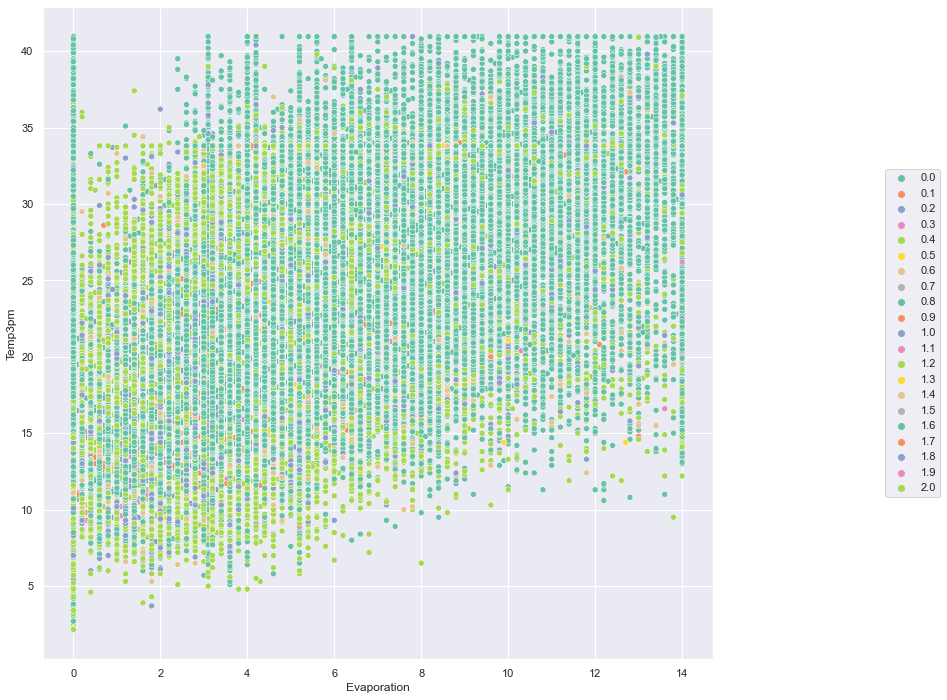

In [42]:
sns.set(rc = {'figure.figsize':(12,12)})
pop = sns.scatterplot(data = df_rain,x = 'Evaporation', y = 'Temp3pm', hue = 'Rainfall', palette = 'Set2')
pop.legend(loc = 'center left', bbox_to_anchor = (1.25, 0.5), ncol = 1);

## Working with Features
### Feature Encoding

In [43]:
def feat_encode(features):
    mapping = {}
    uniqueValues = list(df_rain[features].unique())
    for i in range(len(uniqueValues)):
        mapping[uniqueValues[i]] = i
    return mapping

#replacing the values for binary features
df_rain['RainToday'].replace({'No':0, 'Yes': 1}, inplace = True)
df_rain['RainTomorrow'].replace({'No':0, 'Yes': 1}, inplace = True)

#encoding features that are not bi-variate
df_rain['WindGustDir'].replace(feat_encode('WindGustDir'), inplace = True)
df_rain['WindDir9am'].replace(feat_encode('WindDir9am'),inplace = True)
df_rain['WindDir3pm'].replace(feat_encode('WindDir3pm'),inplace = True)
df_rain['Location'].replace(feat_encode('Location'), inplace = True)
df_rain.RainToday = df_rain.RainToday.astype('float64')
df_rain.RainTomorrow = df_rain.RainTomorrow.astype('float64')
df_rain.WindGustDir = df_rain.WindGustDir.astype('float64')
df_rain.WindDir9am = df_rain.WindDir9am.astype('float64')
df_rain.WindDir3pm = df_rain.WindDir3pm.astype('float64')
df_rain.Location = df_rain.Location.astype('float64')

df_rain.drop(['total_rain'], axis = 1, inplace = True)

In [44]:
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140787 entries, 0 to 145458
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       140787 non-null  float64
 1   MinTemp        140787 non-null  float64
 2   MaxTemp        140787 non-null  float64
 3   Rainfall       140787 non-null  float64
 4   Evaporation    140787 non-null  float64
 5   Sunshine       140787 non-null  float64
 6   WindGustDir    140787 non-null  float64
 7   WindGustSpeed  140787 non-null  float64
 8   WindDir9am     140787 non-null  float64
 9   WindDir3pm     140787 non-null  float64
 10  WindSpeed9am   140787 non-null  float64
 11  WindSpeed3pm   140787 non-null  float64
 12  Humidity9am    140787 non-null  float64
 13  Humidity3pm    140787 non-null  float64
 14  Pressure9am    140787 non-null  float64
 15  Pressure3pm    140787 non-null  float64
 16  Cloud9am       140787 non-null  float64
 17  Cloud3pm       140787 non-nul

Great, now all the variables are numerical.

### Defining our features and targets
#### Independent and Dependent Variables

- X: Independent Features or Input features
- y: Dependent Features or target label

In [45]:
X = df_rain.drop(['RainTomorrow'],axis=1)
y = df_rain['RainTomorrow']

#### Feature Importance
We run the below code to show us the importance of each column and it's relation. 

In [46]:
extraTrees = ExtraTreesRegressor()
extraTrees.fit(X,y)

ExtraTreesRegressor()

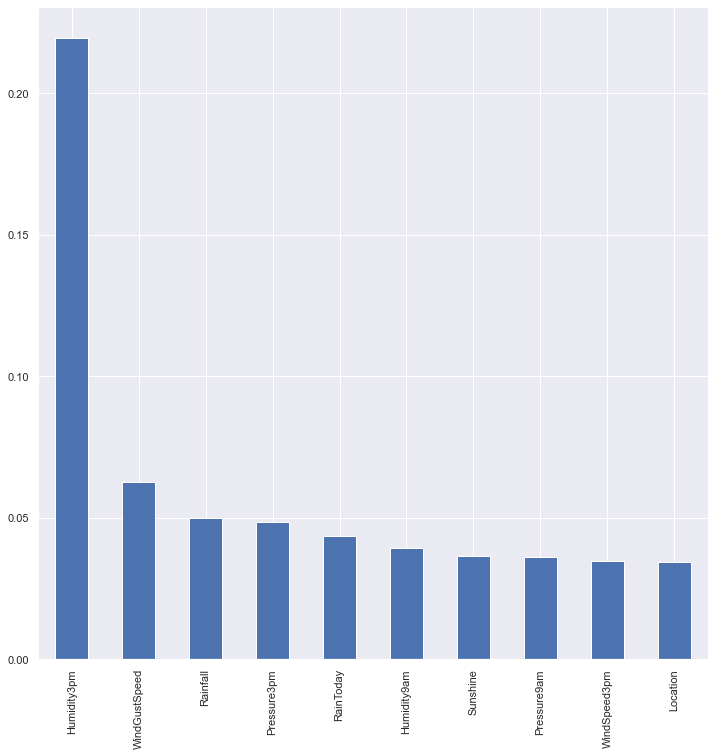

In [47]:
importance = pd.Series(extraTrees.feature_importances_, index = X.columns)
importance.nlargest(10).plot(kind = 'bar');

This is great information for us, it shows that the measure taken at 3 pm for humidity, will be important in our predictive analytics. 

### Splitting into Train and Test data
Divide the data into training set and test set randomly with ratio 80:20. 

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [49]:
print(len(X))
print(len(X_train))
print(len(X_test))

140787
112629
28158


## Finding the Best Model
I will be building and testing multiple models to predict if it will rain tomorrow or not in Australia. 

### Importing the needed Machine Learning Libraries

In [50]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression,SGDClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, VotingClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV, StratifiedKFold
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.metrics import roc_curve
from confusion_viz import ConfusionViz
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import Pipeline

### Feature Scaling
All features are needing to be standardized because it helps scale the data of each column to a common degree. All features are measured by different units in our dataset so standardization helps by removing the mean and creating a more common measurement. 

In [51]:
scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)

### Testing for the Best kfold

In [52]:
#our base models
models = []
models.append(('LogR', LogisticRegression()))
models.append(('Bagging', BaggingClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('RFC', RandomForestClassifier()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('ADA', AdaBoostClassifier()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('ET', ExtraTreesClassifier(n_estimators=15)))

random_state= 30

In [53]:
#accuracy score for basic models where kfold=5
results = []
names = []
for name, model in models:
    kfold = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    accuracy = "%s: %f (%f)" %(name, cv_results.mean(), cv_results.std())
    print("Accuracy for Standardized Data - kfold = 5", accuracy)

Accuracy for Standardized Data - kfold = 5 LogR: 0.842190 (0.001872)
Accuracy for Standardized Data - kfold = 5 Bagging: 0.846256 (0.001565)
Accuracy for Standardized Data - kfold = 5 KNN: 0.833613 (0.000941)
Accuracy for Standardized Data - kfold = 5 RFC: 0.858083 (0.001199)
Accuracy for Standardized Data - kfold = 5 LDA: 0.840911 (0.001541)
Accuracy for Standardized Data - kfold = 5 ADA: 0.845324 (0.002346)
Accuracy for Standardized Data - kfold = 5 GBM: 0.852454 (0.001990)
Accuracy for Standardized Data - kfold = 5 ET: 0.848068 (0.001571)


In [54]:
#accuracy score for basic models where kfold=10
resultsk10 = []
namesk10 = []
for name, model in models:
    kfold10 = StratifiedKFold(n_splits=10, random_state=random_state, shuffle=True)
    cv_resultsk10 = cross_val_score(model, X_train, y_train, cv=kfold10, scoring='accuracy')
    resultsk10.append(cv_resultsk10)
    namesk10.append(name)
    accuracyk10 = "%s: %f (%f)" %(name, cv_resultsk10.mean(), cv_resultsk10.std())
    print("Accuracy for Standardized Data - kfold = 10", accuracyk10)

Accuracy for Standardized Data - kfold = 10 LogR: 0.842270 (0.003828)
Accuracy for Standardized Data - kfold = 10 Bagging: 0.847446 (0.003501)
Accuracy for Standardized Data - kfold = 10 KNN: 0.834758 (0.002737)
Accuracy for Standardized Data - kfold = 10 RFC: 0.859761 (0.002919)
Accuracy for Standardized Data - kfold = 10 LDA: 0.840769 (0.002707)
Accuracy for Standardized Data - kfold = 10 ADA: 0.845262 (0.003301)
Accuracy for Standardized Data - kfold = 10 GBM: 0.852826 (0.003197)
Accuracy for Standardized Data - kfold = 10 ET: 0.849168 (0.002688)


In [55]:
#accuracy score for basic models where kfold=15
resultsk15 = []
namesk15 = []
for name, model in models:
    kfold15 = StratifiedKFold(n_splits=15, random_state=random_state, shuffle=True)
    cv_resultsk15 = cross_val_score(model, X_train, y_train, cv=kfold15, scoring='accuracy')
    resultsk15.append(cv_resultsk15)
    namesk15.append(name)
    accuracyk15 = "%s: %f (%f)" %(name, cv_resultsk15.mean(), cv_resultsk15.std())
    print("Accuracy for Standardized Data - kfold = 15", accuracyk15)

Accuracy for Standardized Data - kfold = 15 LogR: 0.842438 (0.003920)
Accuracy for Standardized Data - kfold = 15 Bagging: 0.847561 (0.002475)
Accuracy for Standardized Data - kfold = 15 KNN: 0.834883 (0.003635)
Accuracy for Standardized Data - kfold = 15 RFC: 0.858971 (0.004552)
Accuracy for Standardized Data - kfold = 15 LDA: 0.840734 (0.003578)
Accuracy for Standardized Data - kfold = 15 ADA: 0.845564 (0.003811)
Accuracy for Standardized Data - kfold = 15 GBM: 0.852960 (0.003663)
Accuracy for Standardized Data - kfold = 15 ET: 0.849346 (0.003296)


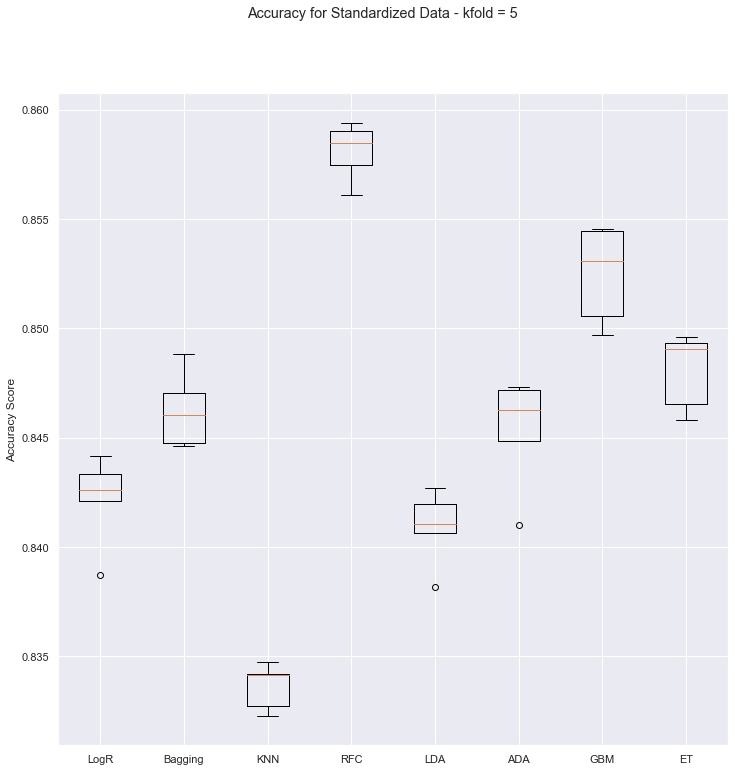

In [56]:
#compare algorithms at k=5
fig = pyplot.figure()
fig.suptitle('Accuracy for Standardized Data - kfold = 5')
plt.ylabel('Accuracy Score')
ax = fig.add_subplot()
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

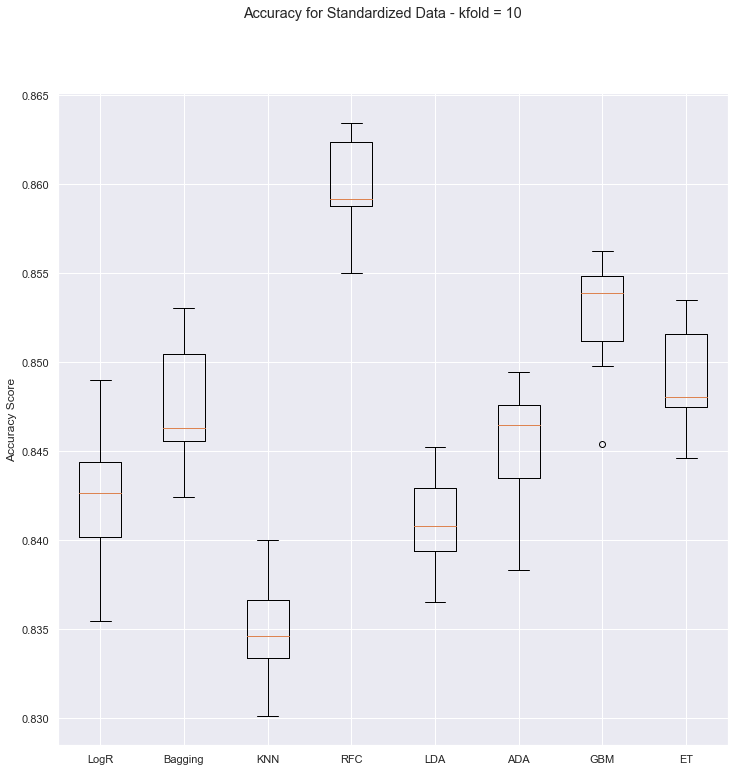

In [57]:
#compare algorithms at k=10
fig = pyplot.figure()
fig.suptitle('Accuracy for Standardized Data - kfold = 10')
plt.ylabel('Accuracy Score')
ax = fig.add_subplot()
pyplot.boxplot(resultsk10)
ax.set_xticklabels(namesk10)
pyplot.show()

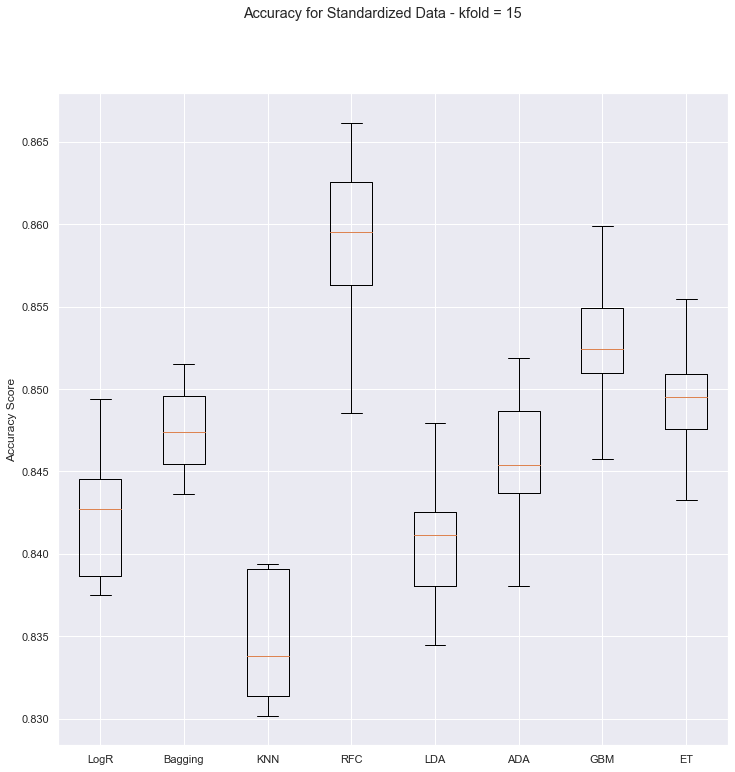

In [58]:
#compare algorithms at k=15
fig = pyplot.figure()
fig.suptitle('Accuracy for Standardized Data - kfold = 15')
plt.ylabel('Accuracy Score')
ax = fig.add_subplot()
pyplot.boxplot(resultsk15)
ax.set_xticklabels(namesk15)
pyplot.show()

kfold = 15 returned the best results. We are looking for the closest accuracy score to 1. Random Forest Classifier has the best score across all three kfolds tested. From here our top 3 performing algorithms are Random Forest Classifier, GBM, and ET. Let's see if these continue to be the top three after improving the performance of our models and obtaining the best dataset by using some ensemble methods. 

I'm going to run this to check the precision, the closer to 1, the better the precision. 

In [59]:
#precision score for basic models
results2 = []
names2 = []
for name, model in models:
    kfold2 = StratifiedKFold(n_splits=15, random_state=random_state, shuffle=True)
    cv_results2 = cross_val_score(model, X_train, y_train, cv=kfold2, scoring='precision')
    results2.append(cv_results2)
    names2.append(name)
    precision = "%s: %f (%f)" %(name, cv_results2.mean(), cv_results2.std())
    print("Precision for Standardized Data - kfold = 15", precision)

Precision for Standardized Data - kfold = 15 LogR: 0.715482 (0.013739)
Precision for Standardized Data - kfold = 15 Bagging: 0.734768 (0.014177)
Precision for Standardized Data - kfold = 15 KNN: 0.680962 (0.010847)
Precision for Standardized Data - kfold = 15 RFC: 0.775906 (0.014019)
Precision for Standardized Data - kfold = 15 LDA: 0.696033 (0.012369)
Precision for Standardized Data - kfold = 15 ADA: 0.722404 (0.011517)
Precision for Standardized Data - kfold = 15 GBM: 0.751975 (0.011735)
Precision for Standardized Data - kfold = 15 ET: 0.739716 (0.008393)


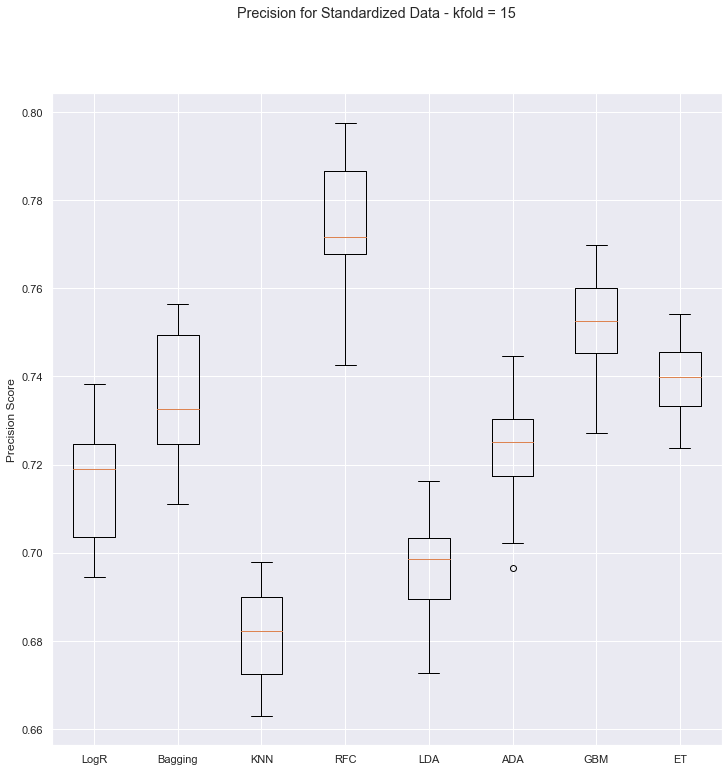

In [60]:
#compare algorithms
fig = pyplot.figure()
fig.suptitle('Precision for Standardized Data - kfold = 15')
plt.ylabel('Precision Score')
ax = fig.add_subplot()
pyplot.boxplot(results2)
ax.set_xticklabels(names2)
pyplot.show()

It looks like the model with the best precision is also Random Forest Classifier. Our other top models are still GBM, and ET, with Bagging Classifier close behind. None of these are very close to having a precision score close to 1 so I will make the testing better by setting a pipeline for each model and scaling the data. This will make the data so it's all treated the same for each algorithm. 

### Scaling the data
This will standardize the dataset. I will then test for the best model with the optimized data. 

In [61]:
#optimized data with our models where kfold=15
n_jobs=15

pipeline_models=[]
pipeScaled_lr = ('S_LogR', Pipeline([('Scaler', StandardScaler()),
                                       ('LogR', LogisticRegression(random_state=random_state, n_jobs=n_jobs, 
                                                                   max_iter=500))]))
pipeScaled_bag = ('S_Bagg', Pipeline
                  ([('Scaler', StandardScaler()),('Bagging', 
                                                  BaggingClassifier(base_estimator=SGDClassifier
                                                                    (random_state=random_state, n_jobs=n_jobs, 
                                                                     max_iter=1500), random_state=random_state,
                                                                    oob_score=True,n_jobs=n_jobs))]))
pipeScaled_knn = ('S_KNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsClassifier(n_jobs=n_jobs))]))

pipeScaled_rf = ('S_RF', Pipeline([('Scaler', StandardScaler()),
                                       ('RFC', RandomForestClassifier(random_state=random_state,oob_score=True, 
                                                                      n_jobs=n_jobs))]))
pipeScaled_lda = ('S_LDA', Pipeline([('Scaler', StandardScaler()),('LDA', LinearDiscriminantAnalysis())]))
pipeScaled_ada = ('S_ADA', Pipeline([('Scaler', StandardScaler()),('ADA', AdaBoostClassifier())]))
pipeScaled_gbm = ('S_GBM', Pipeline([('Scaler', StandardScaler()),('GBM', GradientBoostingClassifier())]))
pipeScaled_et = ('S_ET', Pipeline([('Scaler', StandardScaler()),('ET', ExtraTreesClassifier(n_estimators=15))]))


pipeline_models.append(pipeScaled_lr)
pipeline_models.append(pipeScaled_bag)
pipeline_models.append(pipeScaled_knn)
pipeline_models.append(pipeScaled_rf)
pipeline_models.append(pipeScaled_lda)
pipeline_models.append(pipeScaled_ada)
pipeline_models.append(pipeScaled_gbm)
pipeline_models.append(pipeScaled_et)

In [62]:
#accuracy score of optimized data
results3 = []
names3 = []
for name, model in pipeline_models:
    kfold3 = StratifiedKFold(n_splits=n_jobs, random_state=random_state, shuffle=True)
    cv_results3 = cross_val_score(model, X_train, y_train, cv=kfold3, scoring='accuracy')
    results3.append(cv_results3)
    names3.append(name)
    acc_2 = "%s: %f (%f)" %(name, cv_results3.mean(), cv_results3.std())
    print('Accuracy for Standardized Data - kfold = 15', acc_2)

Accuracy for Standardized Data - kfold = 15 S_LogR: 0.842430 (0.003944)
Accuracy for Standardized Data - kfold = 15 S_Bagg: 0.842225 (0.003772)
Accuracy for Standardized Data - kfold = 15 S_KNN: 0.834963 (0.003646)
Accuracy for Standardized Data - kfold = 15 S_RF: 0.859557 (0.004512)
Accuracy for Standardized Data - kfold = 15 S_LDA: 0.840734 (0.003578)
Accuracy for Standardized Data - kfold = 15 S_ADA: 0.845564 (0.003811)
Accuracy for Standardized Data - kfold = 15 S_GBM: 0.852960 (0.003663)
Accuracy for Standardized Data - kfold = 15 S_ET: 0.849337 (0.003478)


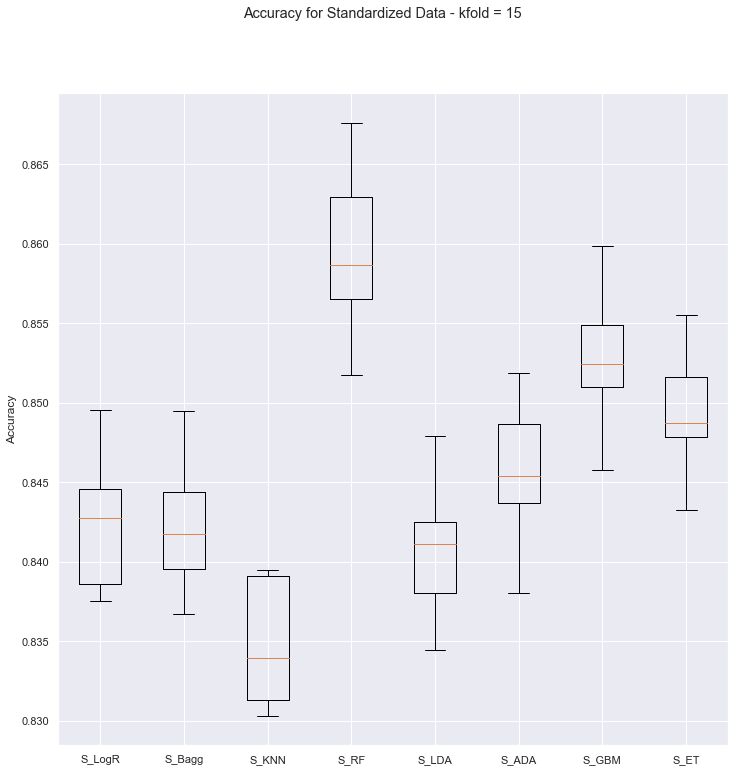

In [63]:
#compare algorithms of optimized data
fig = pyplot.figure()
fig.suptitle('Accuracy for Standardized Data - kfold = 15')
plt.ylabel('Accuracy')
ax = fig.add_subplot()
pyplot.boxplot(results3)
ax.set_xticklabels(names3)
pyplot.show()

### Stacking Ensemble Method
This will standardize the dataset slightly more than the earlier attempt at standardizing the data. We already scaled the data before testing the accuracy and precision of the models so we will try a stacking ensemble method. 

In [64]:
#basic ensemble models
stacking_model = []

stacking_model.append((('LogR', LogisticRegression())))
stacking_model.append((('GBM', GradientBoostingClassifier())))
stacking_model.append((('Bagging', BaggingClassifier())))
stacking_model.append((('KNN', KNeighborsClassifier())))
stacking_model.append((('LDA', LinearDiscriminantAnalysis())))
stacking_model.append((('ADA', AdaBoostClassifier())))
stacking_model.append((('RFC', RandomForestClassifier(n_estimators=15))))
stacking_model.append((('ET', ExtraTreesClassifier(n_estimators=15))))

In [65]:
#accuracy scores of ensemble models
results4 = []
names4 = []
for name, model in stacking_model:
    kfold4 = StratifiedKFold(n_splits=n_jobs, random_state=random_state, shuffle=True)
    cv_results4 = cross_val_score(model, X_train, y_train, cv=kfold4, scoring='accuracy')
    results4.append(cv_results4)
    names4.append(name)
    cv_results4 = "%s: %f (%f)" %(name, cv_results4.mean(), cv_results4.std())
    print('Accuracy after using Stacking Ensemble - kfold=15', cv_results4)

Accuracy after using Stacking Ensemble - kfold=15 LogR: 0.842438 (0.003920)
Accuracy after using Stacking Ensemble - kfold=15 GBM: 0.852960 (0.003663)
Accuracy after using Stacking Ensemble - kfold=15 Bagging: 0.847233 (0.003419)
Accuracy after using Stacking Ensemble - kfold=15 KNN: 0.834883 (0.003635)
Accuracy after using Stacking Ensemble - kfold=15 LDA: 0.840734 (0.003578)
Accuracy after using Stacking Ensemble - kfold=15 ADA: 0.845564 (0.003811)
Accuracy after using Stacking Ensemble - kfold=15 RFC: 0.851806 (0.004252)
Accuracy after using Stacking Ensemble - kfold=15 ET: 0.849222 (0.004034)


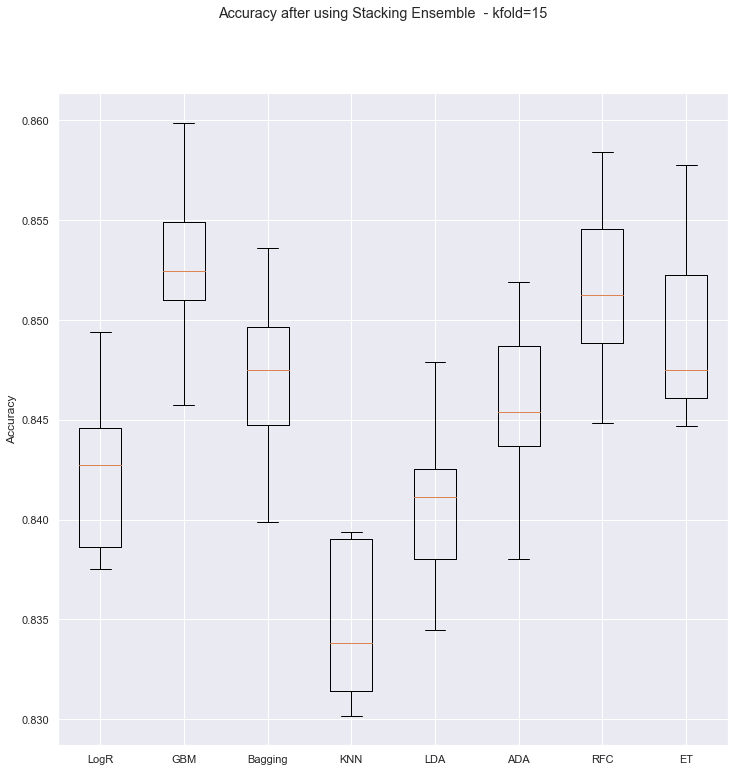

In [66]:
#compare algorithms
fig = pyplot.figure()
fig.suptitle('Accuracy after using Stacking Ensemble  - kfold=15')
plt.ylabel('Accuracy')
ax = fig.add_subplot()
pyplot.boxplot(results4)
ax.set_xticklabels(names4)
pyplot.show()

In [67]:
#precision scores of optimized ensemble models
results5 = []
names5 = []
for name, model in stacking_model:
    kfold5 = StratifiedKFold(n_splits=n_jobs, random_state=random_state, shuffle=True)
    cv_results5 = cross_val_score(model, X_train, y_train, cv=kfold5, scoring='precision')
    results5.append(cv_results5)
    names5.append(name)
    cv_results5 = "%s: %f (%f)" %(name, cv_results5.mean(), cv_results5.std())
    print('Precision after using Stacking Ensemble - kfold=15', cv_results5)

Precision after using Stacking Ensemble - kfold=15 LogR: 0.715482 (0.013739)
Precision after using Stacking Ensemble - kfold=15 GBM: 0.751975 (0.011735)
Precision after using Stacking Ensemble - kfold=15 Bagging: 0.737222 (0.010788)
Precision after using Stacking Ensemble - kfold=15 KNN: 0.680962 (0.010847)
Precision after using Stacking Ensemble - kfold=15 LDA: 0.696033 (0.012369)
Precision after using Stacking Ensemble - kfold=15 ADA: 0.722404 (0.011517)
Precision after using Stacking Ensemble - kfold=15 RFC: 0.734521 (0.012652)
Precision after using Stacking Ensemble - kfold=15 ET: 0.737128 (0.014738)


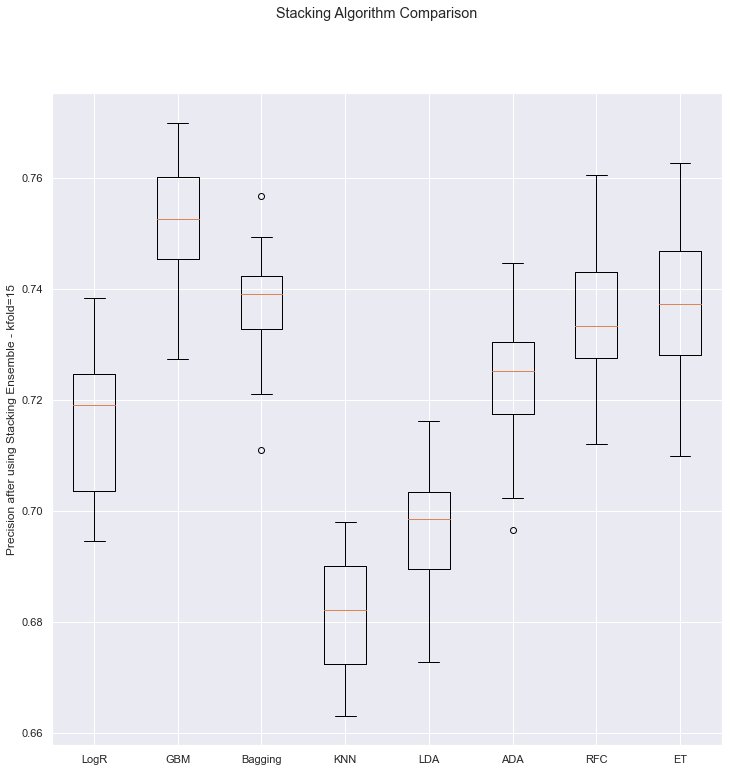

In [68]:
#compare algorithms of optimized data
fig = pyplot.figure()
fig.suptitle('Stacking Algorithm Comparison')
plt.ylabel('Precision after using Stacking Ensemble - kfold=15')
ax = fig.add_subplot()
pyplot.boxplot(results5)
ax.set_xticklabels(names5)
pyplot.show()

### Best Model

From the testing and analysis above, we can see that the best accuracy and precision came when I used a kfold value of 15, and standardized and scaled data. I will test a couple models with this data. The top performing models are Random forest classifier, Gradient Boosting classifier, and the Extra trees classifier. 

### Model #1 - Random Forest Classifier Model

In [69]:
scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)


RF = RandomForestClassifier(random_state = random_state, oob_score = True, n_jobs = n_jobs).fit(X_train, y_train)
cv = cross_val_score(RF, X_train, y_train, cv = 5)
print("The accuracy of Random Forest using 5-fold test is: ",cv)

#Prediction on test dataset
RF_pred = RF.predict(X_test)
acc = accuracy_score(y_test,RF_pred)
print("The accuracy of Random Forest on test dataset is: ",acc)

The accuracy of Random Forest using 5-fold test is:  [0.85980645 0.86131581 0.85527835 0.85847465 0.85975583]
The accuracy of Random Forest on test dataset is:  0.855671567582925


              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91     21897
         1.0       0.77      0.50      0.61      6261

    accuracy                           0.86     28158
   macro avg       0.82      0.73      0.76     28158
weighted avg       0.85      0.86      0.84     28158



<AxesSubplot:>

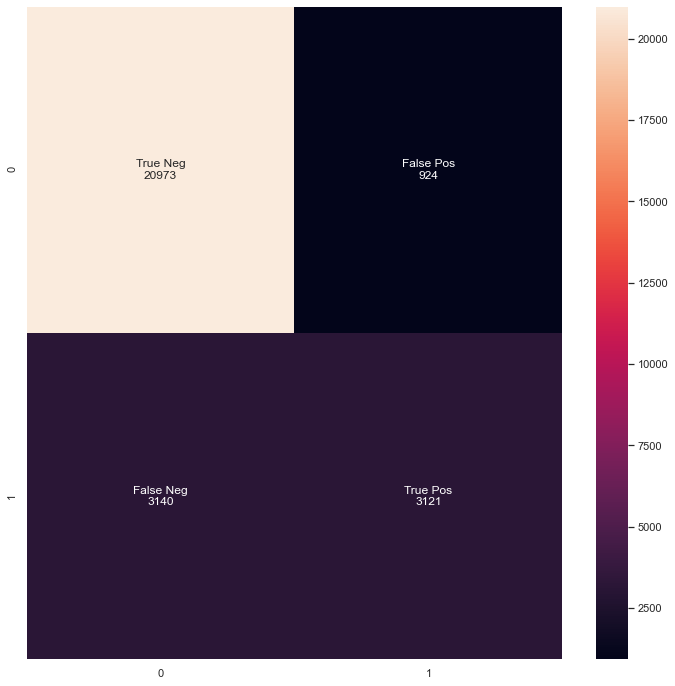

In [70]:
print(classification_report(y_test, RF_pred))

RFmatrix = confusion_matrix(y_test, RF_pred)
RFnames = ['True Neg','False Pos','False Neg','True Pos']
RFcounts = ['{0:0.0f}'.format(value) for value in RFmatrix.flatten()]
RFlabels = [f'{v1}\n{v2}' for v1, v2 in
          zip(RFnames, RFcounts)]
RFlabels = np.asarray(RFlabels).reshape(2,2)
sns.heatmap(RFmatrix, annot = RFlabels, fmt='')

In [71]:
print(classification_report(y_test, RF_pred))

              precision    recall  f1-score   support

         0.0       0.87      0.96      0.91     21897
         1.0       0.77      0.50      0.61      6261

    accuracy                           0.86     28158
   macro avg       0.82      0.73      0.76     28158
weighted avg       0.85      0.86      0.84     28158



In [72]:
print(roc_auc_score(y_test, RF_pred))

0.7281425545950758


In [73]:
RF_proba = cross_val_predict(RF, X_train, y_train, cv = 5, method = 'predict_proba')
RF_scores = RF_proba[:, 1]

def ROC_Curve(y_train, RF_scores, label = None):    
    fpr, tpr, thresholds = roc_curve(y_train, RF_scores)
    print('AUC Score: {:.2f} '.format(roc_auc_score(y_train, RF_scores)))
    plt.figure(figsize = (8, 6))
    plt.plot(fpr, tpr, linewidth = 2, label = label, color = 'b')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

AUC Score: 0.89 


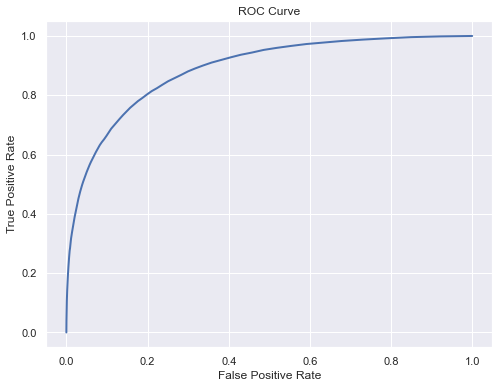

In [74]:
ROC_Curve(y_train, RF_scores)

In [75]:
conf_viz = ConfusionViz()
conf_viz.fit(y_true = y_test, probas_pred = RF_pred)
conf_viz.show()
conf_viz.to_html('RF_confusion_viz.html')

### Model #2 - Gradient Boosting Classifier Model 

In [76]:
GB = GradientBoostingClassifier(random_state = random_state).fit(X_train, y_train)
cv = cross_val_score(GB, X_train, y_train, cv = 5)
print("The accuracy of Gradient Boosting Classifier using 5-fold test is: ",cv)

#Prediction on test dataset
GB_pred = GB.predict(X_test)
acc = accuracy_score(y_test,GB_pred)
print("The accuracy of Gradient Boosting Classifier on test dataset is: ",acc)

The accuracy of Gradient Boosting Classifier using 5-fold test is:  [0.85412412 0.85589985 0.8478203  0.85381337 0.85283019]
The accuracy of Gradient Boosting Classifier on test dataset is:  0.8482491654236807


              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91     21897
         1.0       0.75      0.48      0.59      6261

    accuracy                           0.85     28158
   macro avg       0.81      0.72      0.75     28158
weighted avg       0.84      0.85      0.84     28158



<AxesSubplot:>

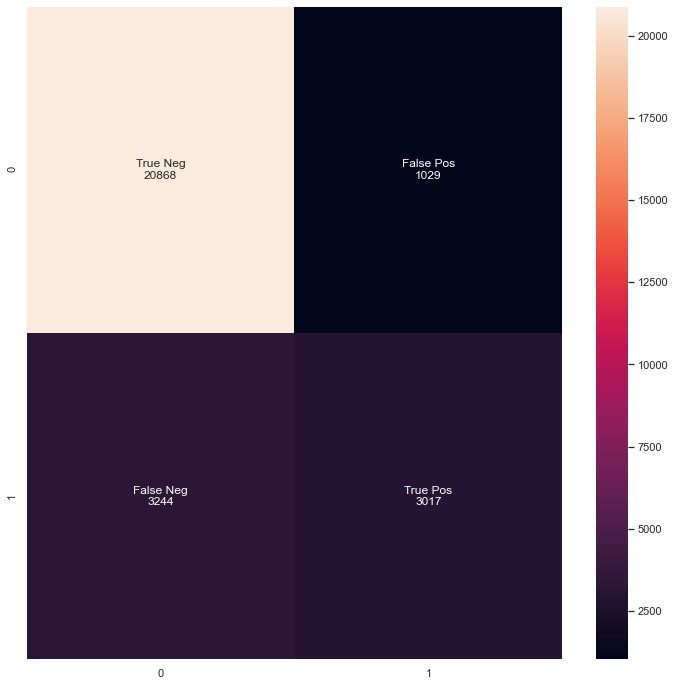

In [77]:
print(classification_report(y_test, GB_pred))

GBmatrix = confusion_matrix(y_test, GB_pred)
GBnames = ['True Neg','False Pos','False Neg','True Pos']
GBcounts = ['{0:0.0f}'.format(value) for value in GBmatrix.flatten()]
GBlabels = [f'{v1}\n{v2}' for v1, v2 in
          zip(GBnames, GBcounts)]
GBlabels = np.asarray(GBlabels).reshape(2,2)
sns.heatmap(GBmatrix, annot = GBlabels, fmt='')

In [78]:
print(classification_report(y_test, GB_pred))

              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91     21897
         1.0       0.75      0.48      0.59      6261

    accuracy                           0.85     28158
   macro avg       0.81      0.72      0.75     28158
weighted avg       0.84      0.85      0.84     28158



In [79]:
print(roc_auc_score(y_test, GB_pred))

0.7174395833575405


In [80]:
GB_proba = cross_val_predict(GB, X_train, y_train, cv = 5, method = 'predict_proba')
GB_scores = GB_proba[:, 1]

def ROC_Curve(y_train, GB_scores, label = None):    
    fpr, tpr, thresholds = roc_curve(y_train, GB_scores)
    print('AUC Score: {:.2f} '.format(roc_auc_score(y_train, GB_scores)))
    plt.figure(figsize = (8, 6))
    plt.plot(fpr, tpr, linewidth = 2, label = label, color = 'b')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

AUC Score: 0.87 


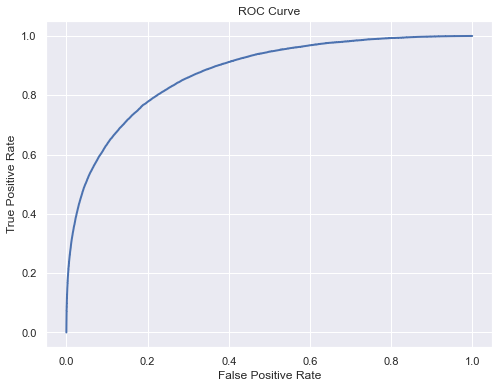

In [81]:
ROC_Curve(y_train, GB_scores)

In [82]:
conf_viz = ConfusionViz()
conf_viz.fit(y_true = y_test, probas_pred = GB_pred)
conf_viz.show()
conf_viz.to_html('GB_confusion_viz.html')

### Model #3 - Extra Trees Classifier Model 

In [83]:
ET = GradientBoostingClassifier(n_estimators = 15, random_state = random_state).fit(X_train, y_train)
cv = cross_val_score(ET, X_train, y_train, cv = 5)
print("The accuracy of Extra Trees using 5-fold test is: ",cv)

#Prediction on test dataset
ET_pred = ET.predict(X_test)
acc = accuracy_score(y_test,ET_pred)
print("The accuracy of Extra Trees on test dataset is: ",acc)

The accuracy of Extra Trees using 5-fold test is:  [0.83827577 0.83867531 0.83330374 0.83512386 0.83862375]
The accuracy of Extra Trees on test dataset is:  0.8340791249378507


              precision    recall  f1-score   support

         0.0       0.84      0.97      0.90     21897
         1.0       0.79      0.35      0.48      6261

    accuracy                           0.83     28158
   macro avg       0.81      0.66      0.69     28158
weighted avg       0.83      0.83      0.81     28158



<AxesSubplot:>

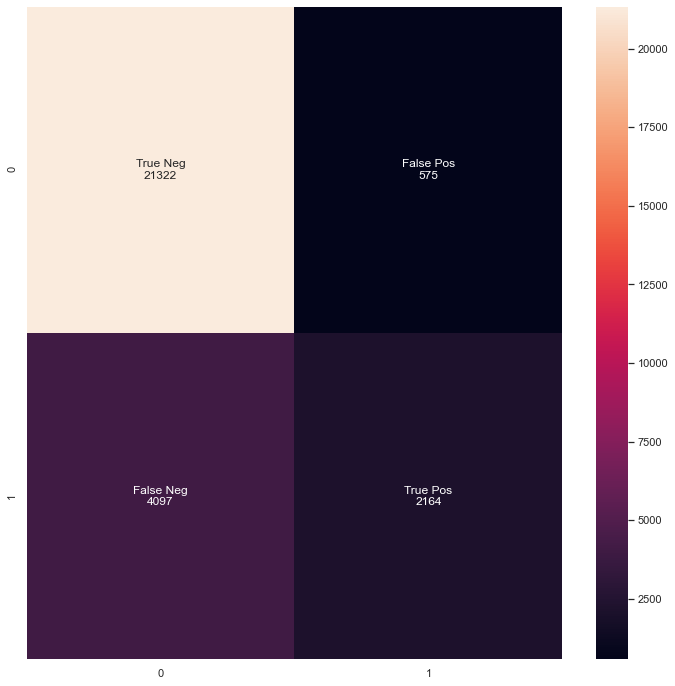

In [84]:
print(classification_report(y_test, ET_pred))

ETmatrix = confusion_matrix(y_test, ET_pred)
ETnames = ['True Neg','False Pos','False Neg','True Pos']
ETcounts = ['{0:0.0f}'.format(value) for value in ETmatrix.flatten()]
ETlabels = [f'{v1}\n{v2}' for v1, v2 in
          zip(ETnames, ETcounts)]
ETlabels = np.asarray(ETlabels).reshape(2,2)
sns.heatmap(ETmatrix, annot = ETlabels, fmt='')

In [85]:
print(roc_auc_score(y_test, ET_pred))

0.659686191650551


In [86]:
ET_proba = cross_val_predict(ET, X_train, y_train, cv = 5, method = 'predict_proba')
ET_scores = ET_proba[:, 1]

def ROC_Curve(y_train, ET_scores, label = None):    
    fpr, tpr, thresholds = roc_curve(y_train, ET_scores)
    print('AUC Score: {:.2f} '.format(roc_auc_score(y_train, ET_scores)))
    plt.figure(figsize = (8, 6))
    plt.plot(fpr, tpr, linewidth = 2, label = label, color = 'b')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

AUC Score: 0.85 


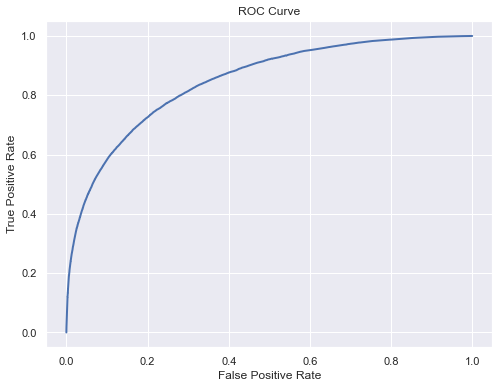

In [87]:
ROC_Curve(y_train, ET_scores)

In [88]:
conf_viz = ConfusionViz()
conf_viz.fit(y_true = y_test, probas_pred = ET_pred)
conf_viz.show()
conf_viz.to_html('ET_confusion_viz.html')

The first model tested was random forest classifier with an accuracy score was .86

The second model tested was Gradient Boosting Classifier with an accuracy score of .85

The third model tested was the extra trees classifier model with an accuracy score of .83

We want to look for the model that has the lowest number for false positives and false negatives. A False positive means that it incorrectly predicted that it was going to rain tomorrow and a false negative means it incorrectly predicted if it was not going to rain tomorrow. Since this situation is not a life or death kind of situation, I don’t feel like one false prediction is a better outcome than the other. It looks like the random forest classifier has the least number of false negatives and the extra trees classifier has the least number of false positives.

# **NOT USED MODELS
Here's a LogR and KNN model that I built before testing the accuract scores of other models. I decided to leave this in the notebook for reference and to show this work. From this I learned that testing the scores before building and training the models will save time because these two models that I built first did not end up being the best fitting models. I am glad I went back and ran the accuracy and precision scores on 6 other models. 

### Logistic Regression Model
- Logistic Regression: statistic based algorthm that allows the prediction of probability/classification problems. This will allow us to predict the probability (yes or no) of whether it will rain tomorrow or not. 

In [89]:
LRmodel = LogisticRegression(solver = 'liblinear', random_state = 30).fit(X_train, y_train)

In [90]:
LRpred= LRmodel.predict(X_test)

In [91]:
# Checking for overfitting or underfitting

print('Accuracy score for test Data: ', accuracy_score(y_test, LRpred))
print('Accuracy score for training data: ', LRmodel.score(X_train, y_train))

Accuracy score for test Data:  0.8392996661694723
Accuracy score for training data:  0.8423674186932317


These scores are almost similar so there's not really a worry of under or over fitting. 

In [92]:
print(classification_report(y_test, LRpred))

              precision    recall  f1-score   support

         0.0       0.86      0.95      0.90     21897
         1.0       0.71      0.47      0.56      6261

    accuracy                           0.84     28158
   macro avg       0.79      0.71      0.73     28158
weighted avg       0.83      0.84      0.83     28158



In [93]:
print(roc_auc_score(y_test, LRpred))

0.7058117677266693


In [94]:
lr_proba = cross_val_predict(LRmodel, X_train, y_train, cv = 5, method = 'predict_proba')
lr_scores = lr_proba[:, 1]

def ROC_Curve(y_train, scores, label = None):    
    fpr, tpr, thresholds = roc_curve(y_train, scores)
    print('AUC Score: {:.2f} '.format(roc_auc_score(y_train, scores)))
    
    plt.figure(figsize = (8, 6))
    plt.plot(fpr, tpr, linewidth = 2, label = label, color = 'b')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show()

AUC Score: 0.86 


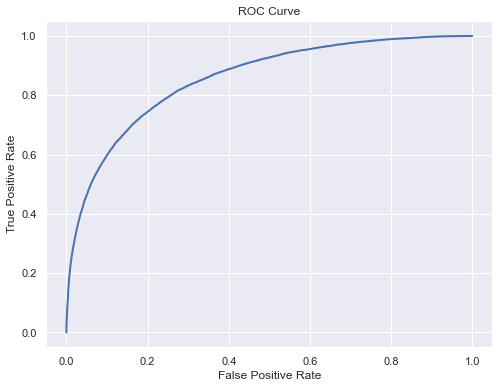

In [95]:
ROC_Curve(y_train, lr_scores)

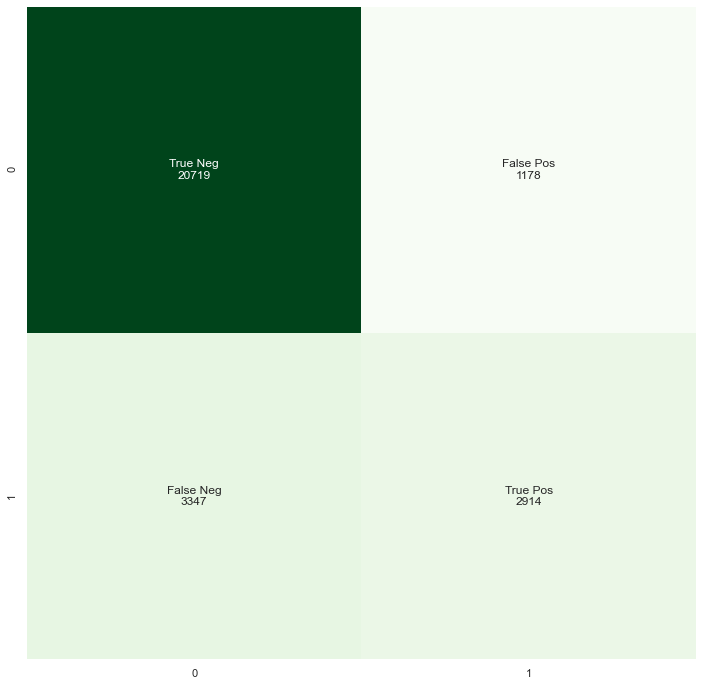

In [96]:
LRmatrix = confusion_matrix(y_test, LRpred)
name = ['True Neg','False Pos','False Neg','True Pos']
count = ['{0:0.0f}'.format(value) for value in
         LRmatrix.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in
          zip(name, count)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(LRmatrix, annot= labels, cbar= None, fmt='', cmap='Greens');

#### Logistic Regression Model Analysis
The average cross-validation accuracy score of 0.842 is close to the original accuracy score of 0.839. So I don't think we need to try to improve this model with cross validation.

The model does a good job at predicting with qn accuracy score off .84. We don't see any signs of over or underfitting, and cross validation won't improve the model.

However, we do see that there is some imbalance in the dataset. The majority of non rainy days (True Negative) is predicted correctly, with the recall at 95%. But, out of the rainy days (true positive), only half are predicted as rainy, and 47% are predicted as non-rainy day (fales positive).


### Model #2 - KNN Model
I will be using classification instead of regression because our target value is binary.

In [97]:
Kmodel = KNeighborsClassifier(n_neighbors=3, n_jobs=-1).fit(X_train, y_train)

In [98]:
Kpred = Kmodel.predict(X_test)

In [99]:
# Checking for overfitting or underfitting

print('Accuracy score for test Data: ', accuracy_score(y_test, Kpred))
print('Accuracy score for training data: ', Kmodel.score(X_train, y_train))

Accuracy score for test Data:  0.8267987783223241
Accuracy score for training data:  0.9018547620950199


The score on the test data is .83 and the score on the training data is pretty good at .86. There doesn't seem to be any over or under fitting here cause the scores are similar enough. 

In [100]:
print(classification_report(y_test, Kmodel.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89     21897
         1.0       0.65      0.48      0.55      6261

    accuracy                           0.83     28158
   macro avg       0.76      0.70      0.72     28158
weighted avg       0.81      0.83      0.82     28158



In [101]:
print(roc_auc_score(y_test, Kpred))

0.7046741945711376


AUC Score: 0.79 


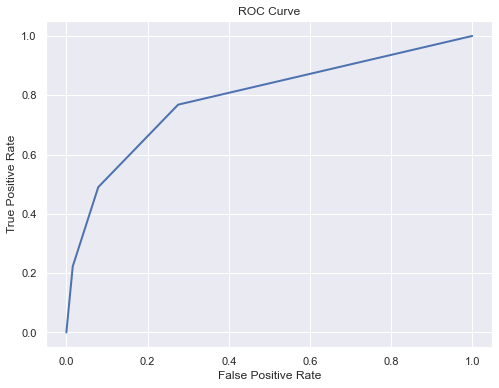

In [102]:
Kpredproba = cross_val_predict(Kmodel, X_train, y_train, cv = 5, method = 'predict_proba')
K_scores = Kpredproba[:, 1]

ROC_Curve(y_train, K_scores)

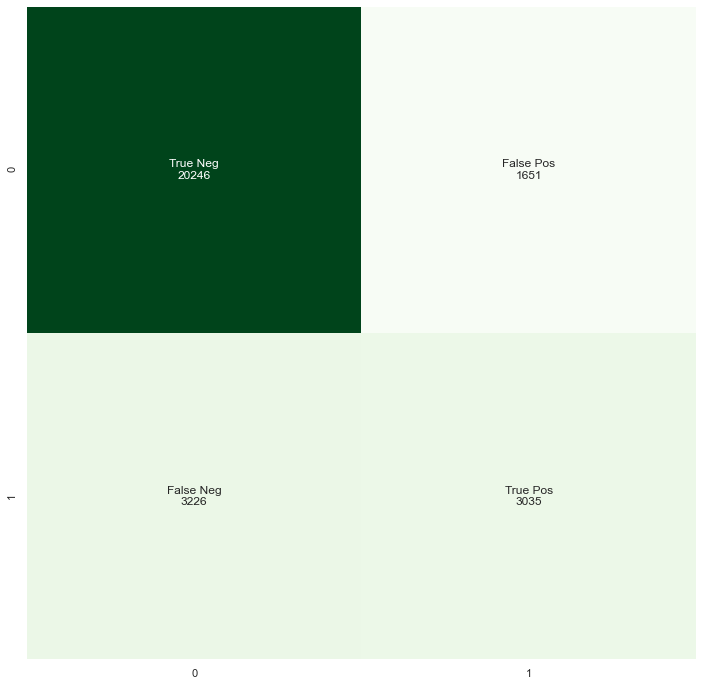

In [103]:
Kmatrix = confusion_matrix(y_test, Kpred)
name = ['True Neg','False Pos','False Neg','True Pos']
count = ['{0:0.0f}'.format(value) for value in
         Kmatrix.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in
          zip(name, count)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(Kmatrix, annot= labels, cbar= None, fmt='', cmap='Greens');

#### Improving the KNN Model by finding the optimal K-value

In [104]:
scores = []

for k in range(2, 12):
    print(f'Evaluating {k} clusters')
    Kmodel = KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
    Kmodel.fit(X_train, y_train)
    scores.append(Kmodel.score(X_test, y_test))

Evaluating 2 clusters
Evaluating 3 clusters
Evaluating 4 clusters
Evaluating 5 clusters
Evaluating 6 clusters
Evaluating 7 clusters
Evaluating 8 clusters
Evaluating 9 clusters
Evaluating 10 clusters
Evaluating 11 clusters


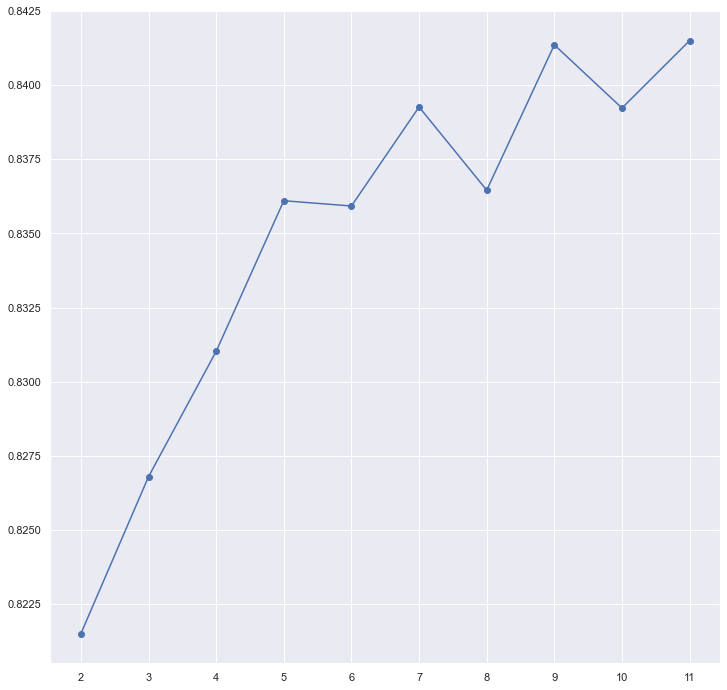

In [105]:
plt.plot(range(2, 12), scores)
plt.scatter(range(2, 12), scores)
_=plt.xticks(range(2, 12))

In [106]:
max(scores)

0.8415015270970949

Looks like 9 is an optimal k value. This gives a score of .84 whereas the original model with 3 clusers had a score of .826. 

#### Using the optimal K value

In [107]:
Kmodel2 = KNeighborsClassifier(n_neighbors = 9).fit(X_train, y_train)
cv = cross_val_score(Kmodel2, X_train, y_train, cv=5)
print("The accuracy of KNN using 5-fold test is: ",cv)

The accuracy of KNN using 5-fold test is:  [0.84062861 0.84018468 0.83898606 0.84014028 0.84084351]


In [108]:
print(classification_report(y_test, Kmodel2.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.86      0.95      0.90     21897
         1.0       0.73      0.46      0.56      6261

    accuracy                           0.84     28158
   macro avg       0.79      0.70      0.73     28158
weighted avg       0.83      0.84      0.83     28158



In [109]:
Kpred2 = Kmodel2.predict(X_test)
print(roc_auc_score(y_test, Kpred2))

0.7045700129492877


In [110]:
Kacc2 = accuracy_score(y_test, Kpred2)
print('Accuracy of KNN test data: ', Kacc2)

Accuracy of KNN test data:  0.8413594715533774


AUC Score: 0.84 


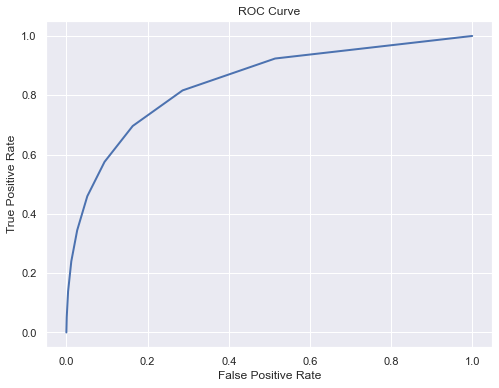

In [111]:
Kpredproba2 = cross_val_predict(Kmodel2, X_train, y_train, cv = 5, method = 'predict_proba')
K_scores2 = Kpredproba2[:, 1]

ROC_Curve(y_train, K_scores2)

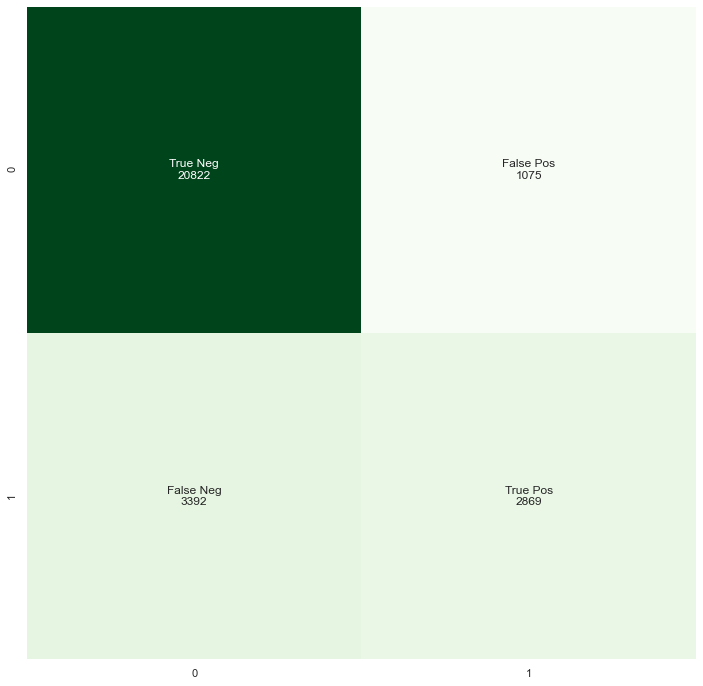

In [112]:
Kmatrix2 = confusion_matrix(y_test, Kpred2)
name = ['True Neg','False Pos','False Neg','True Pos']
count = ['{0:0.0f}'.format(value) for value in
         Kmatrix2.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in
          zip(name, count)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(Kmatrix2, annot= labels, cbar= None, fmt='', cmap='Greens');

#### KNN Model Analysis
    "From the accuracy and confusion matrix, KNN definitely works more worse than logistic regression. The average of accuracy on validation test is around 80.5%, while the accuracy on test dataset with k=15 is 80.95%. The thing that we focus is the recall of class "Yes" and it is only 25%. Which means that KNN only predict correctly 25% rainy day. Next, we will build the Decision Tree classifier."

In [113]:
with open('scaler.pkl', 'wb') as file:
    pickle.dump(scale, file)

with open('logreg.pkl', 'wb') as file:
    pickle.dump(LRmodel, file)

In [114]:
conf_viz = ConfusionViz()
conf_viz.fit(y_true = y_test, probas_pred = LRpred)
conf_viz.show()
conf_viz.to_html('confusion_viz.html')